## Libraries

In [103]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.timeseries import LombScargle

import sys
sys.path.insert(0, '/Users/paula/Documents/school_of_summer/Copia-NWelch-main/src')

import TimeSeries
import Bivariate as Bi

## Start GJ-1002
Data are from <a href="https://ui.adsabs.harvard.edu/abs/2023A%26A...670A...5S/abstract">	
Mascareño et al. (2023)</a>


# Read Data

In [104]:
data = pd.read_csv('GJ1002_SuarezMascareno_2023.txt', delim_whitespace=True,
                  header=None, comment='#', skiprows=50,
                  names=['BJD-2450000', 'RV1', 'RV2', 'RV3', 'RV4', 'e_RV', 'FWHM1', 'FWHM2',
                         'FWHM3', ' e_FWHM', 'Temp', 'Inst'])
data  

/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/2079146661.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv('GJ1002_SuarezMascareno_2023.txt', delim_whitespace=True,


,BJD-2450000,RV1,RV2,RV3,RV4,e_RV,FWHM1,FWHM2,FWHM3,e_FWHM,Temp,Inst
0,7595.622,-1.27,-1.64,-2.10,-1.25,1.50,-0.78,2.86,3.83,12.09,9,0
1,7596.621,0.69,0.31,-0.33,-0.34,1.49,-5.51,-1.87,-0.82,11.93,9,0
2,7606.655,7.91,7.54,5.67,3.70,1.75,11.11,14.74,12.73,12.22,-12,0
3,7610.647,2.51,2.13,0.37,0.49,1.44,5.72,9.35,8.65,12.26,-4,0
4,7613.597,-1.40,-1.78,-3.26,-0.87,1.70,0.39,4.03,4.15,12.36,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
134,9555.545,0.97,0.47,1.87,0.34,0.29,-0.28,-0.46,0.22,1.38,9,3
135,9556.558,-0.46,-0.96,0.64,-0.04,0.29,-0.20,-0.38,0.34,1.38,10,3
136,9557.561,-1.33,-1.83,-0.04,0.04,0.25,-0.78,-0.96,-0.20,1.16,11,3
137,9563.590,-2.09,-2.59,0.30,-0.06,0.23,-2.04,-2.21,-1.71,1.03,6,3


graph the different radial velocities and the FWHM


Text(0.5, 1.0, 'GJ 1002')

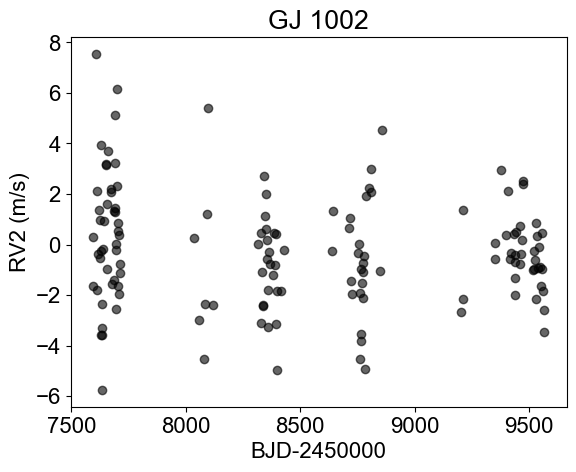

In [105]:
plt.scatter(data['BJD-2450000'].to_numpy(), data['RV2'].to_numpy(), color='k', edgecolor='k', alpha=0.6)
plt.xlabel('BJD-2450000')
plt.ylabel('RV2 (m/s)')
plt.title('GJ 1002')

Text(0.5, 1.0, 'GJ 1002')

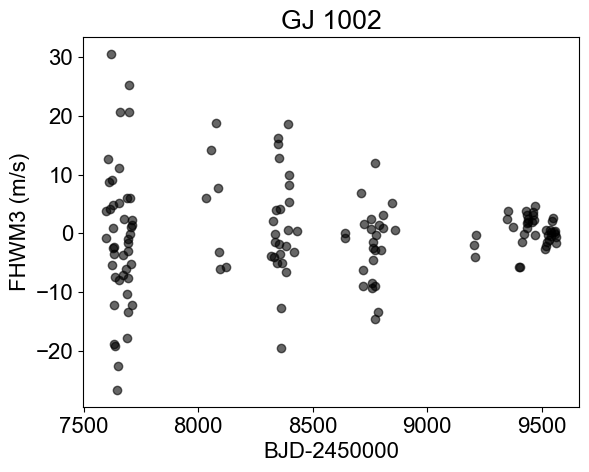

In [106]:
plt.scatter(data['BJD-2450000'].to_numpy(), data['FWHM3'].to_numpy(), color='k', edgecolor='k', alpha=0.6)
plt.xlabel('BJD-2450000')
plt.ylabel('FHWM3 (m/s)')
plt.title('GJ 1002')

rvt2: A time series of times and values ​​of radial velocity (RV2). 

FW: A time series of times and half-width values ​​of the spectral lines (FWHM3).

In [107]:
rvt2 = TimeSeries.TimeSeries(data['BJD-2450000'].to_numpy(), data['RV2'].to_numpy())
FW= TimeSeries.TimeSeries(data['BJD-2450000'].to_numpy(), data['FWHM3'].to_numpy())

Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051


timeseries histogram

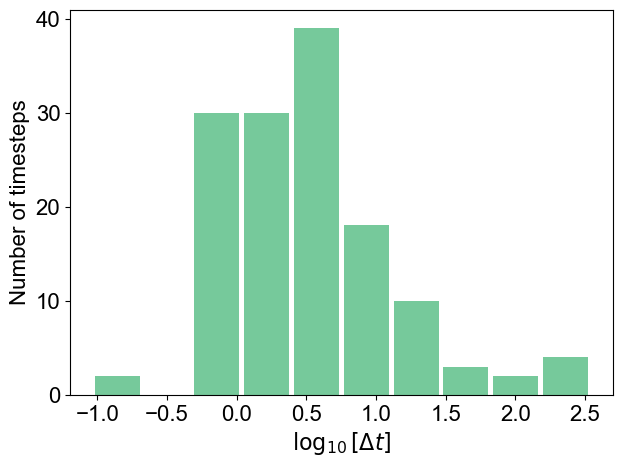

In [108]:
rvt2.dthist() 

We used the method 'frequency_grid(0.16714)' to generate the frequency grid.
The 'pow_FT()' method calculates the Fourier transform of the time series on the frequency grid defined using 'frequency_grid,' generating the power spectrum.


In [109]:
rvt2.frequency_grid(0.16714 ) 
rvt2.pow_FT()
FW.frequency_grid(0.16714 )
FW.pow_FT()


Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500


Observate the periodograms

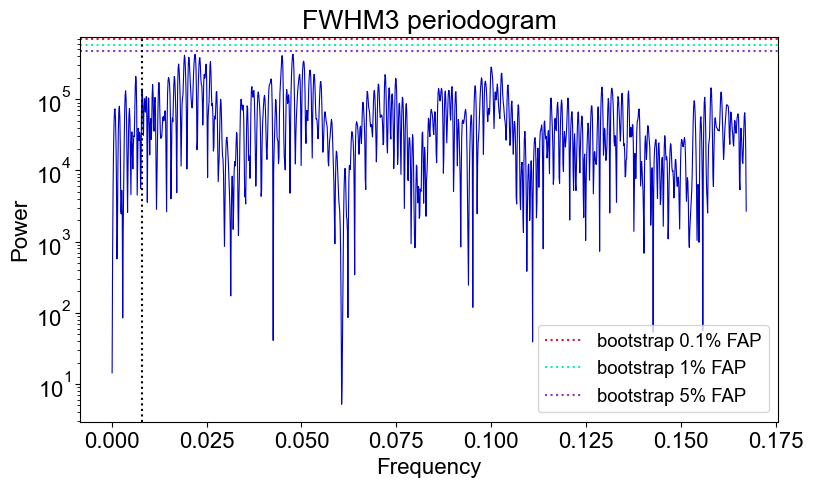

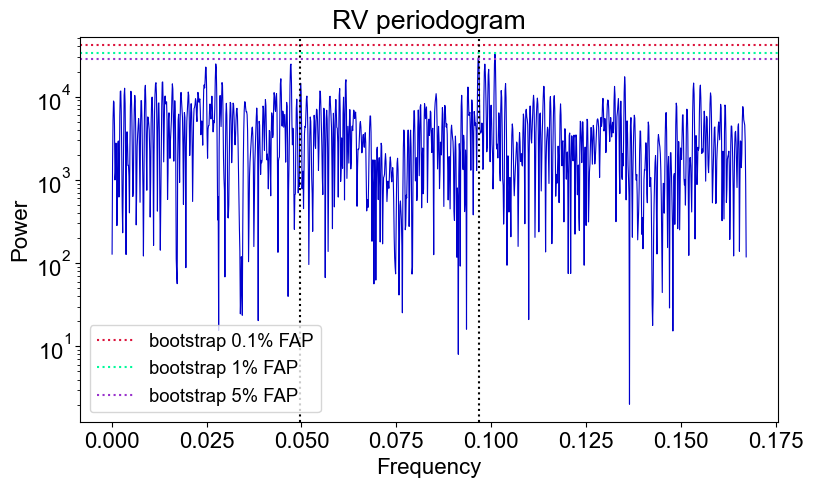

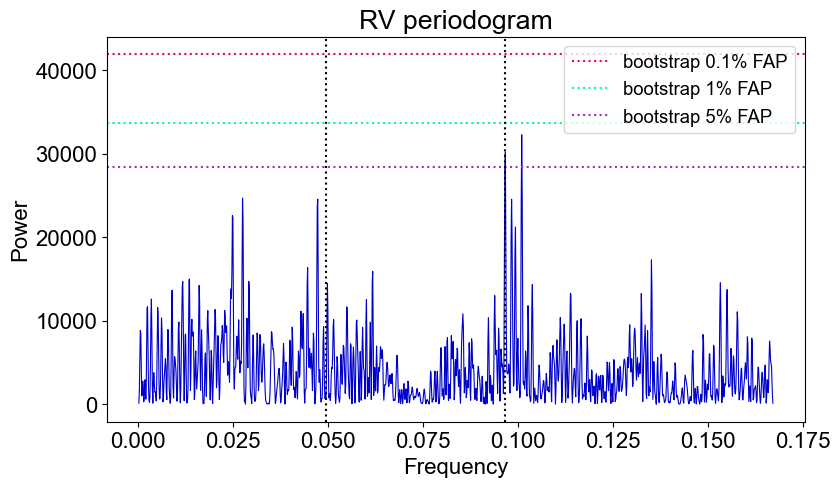

In [110]:
pb = 10.3465 # Period planet b report in the papper
pc =  20.202 # Period planet c report in the papper
prot = 126 # Period rotation report in the papper
planets = [1/pb, 1/pc]
rotation = [1/prot]

FW.powplot(title=r"FWHM3 periodogram", vlines=rotation)
rvt2.powplot(title='RV periodogram', vlines=planets)
rvt2.powplot(title='RV periodogram', vlines=planets, yscale='linear')

Stadistical Test

In [111]:
rvt2.Siegel_test()
FW.Siegel_test()

T statistic: 0.00320
T threshold for rejecting white noise hypothesis at 5% level: 0.00571
Null hypothesis not rejected: This time series could be white noise (or red noise; beware)
T statistic: 0.00484
T threshold for rejecting white noise hypothesis at 5% level: 0.00571
Null hypothesis not rejected: This time series could be white noise (or red noise; beware)


use WELCH

Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500


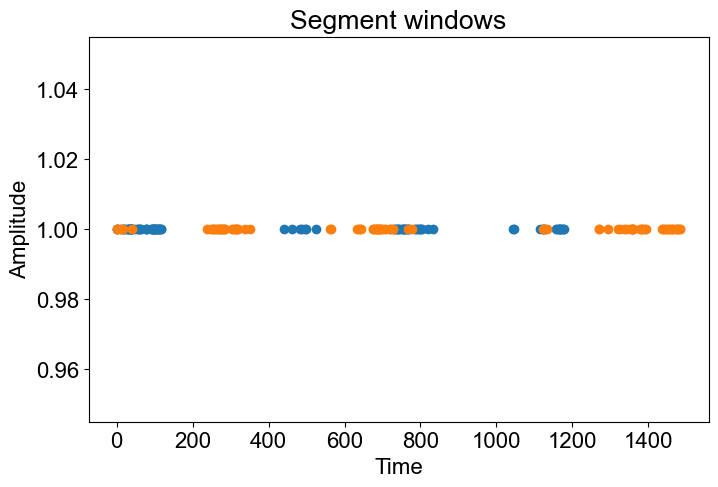

In [112]:
nyquistm = 0.03504
rvt2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = True)
rvt2.Welch_powspec()
rvt2.Welch_powspec_bootstrap()

(30, 40000)

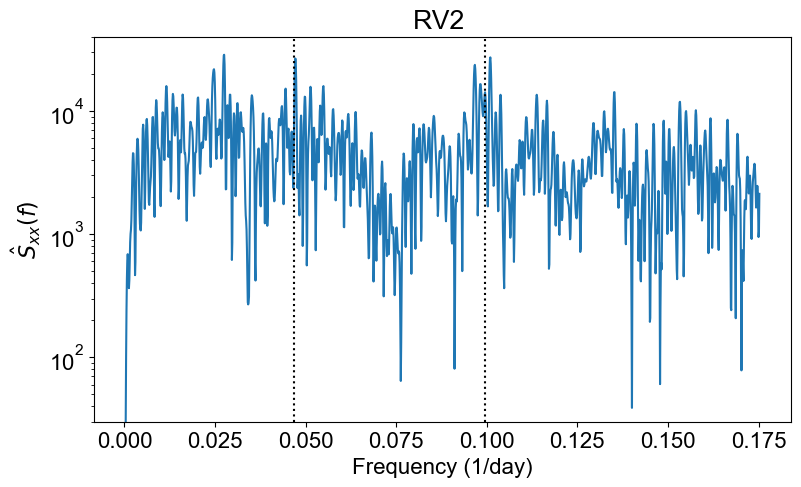

In [113]:
optimistic_resolution = 0.000673
fb = 1/pb
fc = 1/pc
moon = 1/29.5
year = 1/365.25
plt.figure(figsize=(9,5))
plt.semilogy(rvt2.Welch_powgrid[2:], rvt2.Welch_pow[2:])
plt.title('RV2 ')
plt.xlabel('Frequency (1/day)')
plt.ylabel(r"$\hat{S}_{xx}(f)$")
plt.axvline(fb+year, ls=':', color='k')
plt.axvline(fc-year, ls=':', color='k')
plt.ylim([30, 40000])

In [114]:
nyquistm = 0.03504
FW.segment_data(2, 5*nyquistm, window = 'None')
FW.Welch_powspec()
FW.Welch_powspec_bootstrap()

Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500


Text(0, 0.5, '$\\hat{S}_{yy}(f)$')

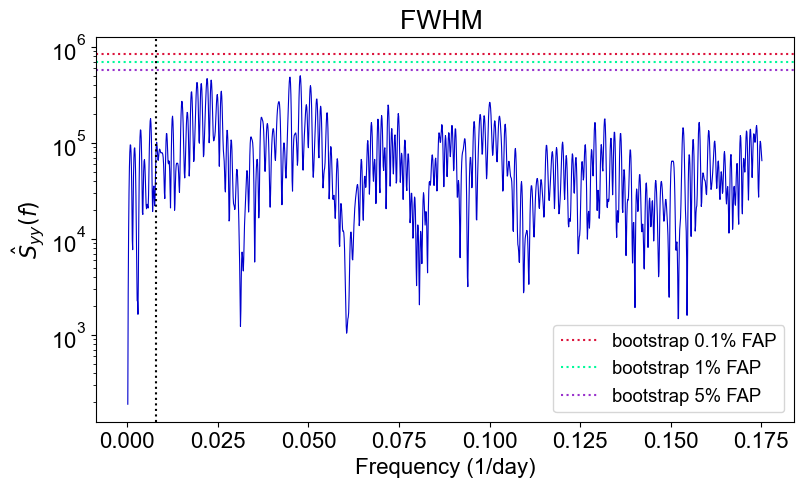

In [115]:
FW.powplot(Welch = True,title='FWHM ', vlines=rotation)
plt.xlabel('Frequency (1/day)')
plt.ylabel(r"$\hat{S}_{yy}(f)$")


Bivariate analysis to combine both datasets

Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Number of data points per segment: 92
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Iteration 0
Iteration 500
Iteration 1000
Iteration 

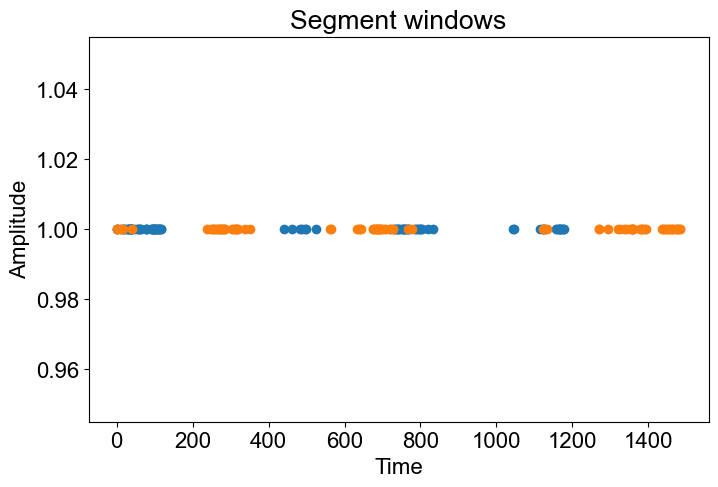

In [116]:
rv_= Bi.Bivariate(data['BJD-2450000'].to_numpy(), data['RV2'].to_numpy(),data['FWHM3'].to_numpy())
rv_.segment_data(2, 0.16714, oversample=6, window='None', plot_windows=True)
rv_.Welch_coherence_powspec()
rv_.Welch_coherence_powspec_bootstrap()

In [117]:
rv_.Siegel_Welch()

Siegel's test on Sxx:
T statistic: 0.00000
T threshold for rejecting white noise hypothesis at 5% level: 0.00523
Null hypothesis not rejected: This time series could be white noise (or red noise; beware)
Siegel's test on Syy:
T statistic: 0.00049
T threshold for rejecting white noise hypothesis at 5% level: 0.00523
Null hypothesis not rejected: This time series could be white noise (or red noise; beware)


Text(0.5, 0, 'Frequency (1/day)')

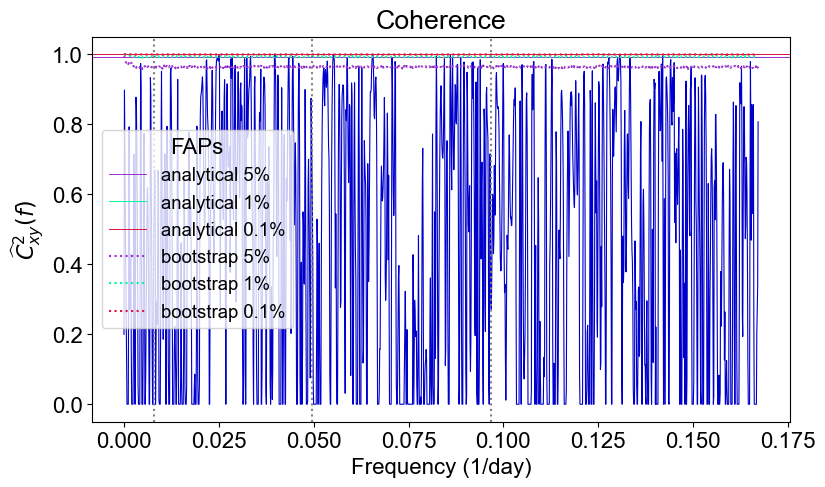

In [118]:
pd = 20.202
pg = 10.3465 
stellar_signals = [1/prot, 1/pd, 1/pg]
rv_.coh_plot(show_theoretical_thresholds=True, vlines=stellar_signals)
plt.xlabel('Frequency (1/day)')

Text(0.5, 0, 'Frequency (1/day)')

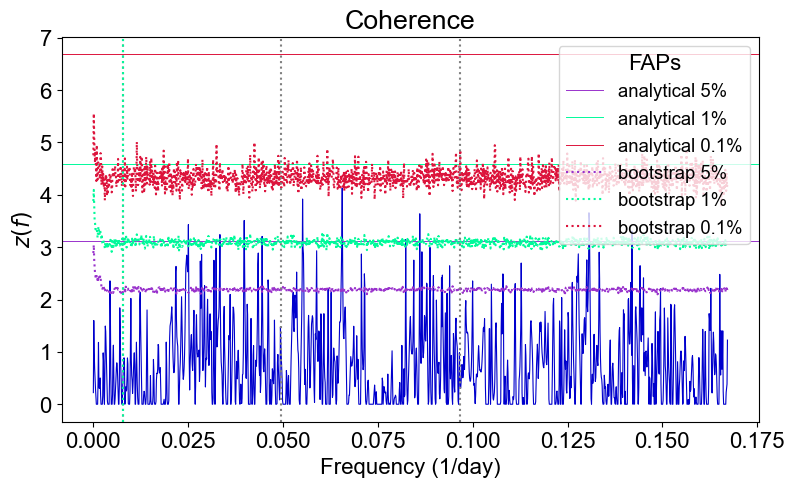

In [119]:
rv_.coh_plot(show_theoretical_thresholds=True, show_boot_thresholds=True, transformed=True, vlines=stellar_signals)
plt.axvline(1/prot, color='mediumspringgreen', ls=':')
plt.xlabel('Frequency (1/day)')

Spectral Windows with bivarate

Half bandwidth: 0.003033
Welch average spectral window not saved to file


Text(0.5, 0, 'Frequency (1/day)')

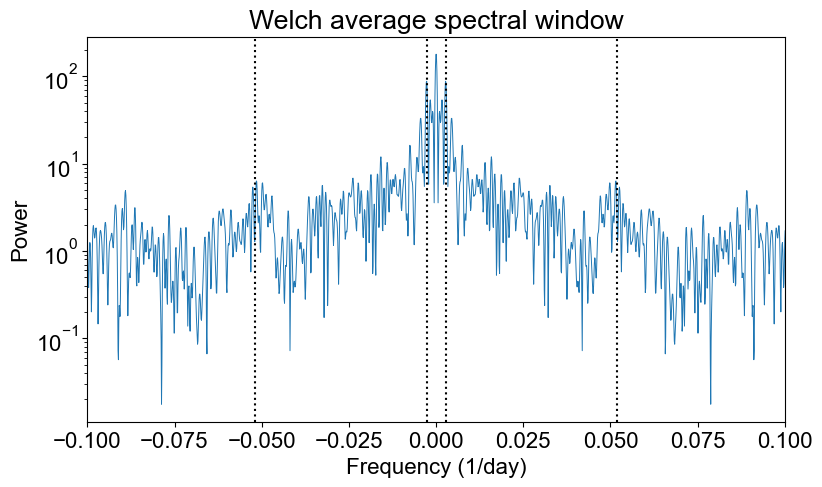

In [120]:
moon = 1/29.5
year = 1/365.25
rv_.x_series.spectral_window_Welch()
plt.xlim([-0.1, 0.1])
plt.axvline(0.052, ls=':', color='k')
plt.axvline(-0.052, ls=':', color='k')

plt.axvline(year, ls=':', color='k')
plt.axvline(-year, ls=':', color='k')
plt.xlabel('Frequency (1/day)')

Pseudowindow
Create four versions of a fake signal moving the phase with the same period as each planet
Calculate and plot the Lomb-Scargle periodogram of each fake signal
Calculate and plot the Welch's power spectrum and spectral window

Planet b

In [121]:
t = data['BJD-2450000'].values
RV1F=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]

for j in range(len(phase)):
    RV1F[j,:]=np.sin(2 * np.pi * 1/pb * t + phase[j])

In [122]:
RV1FT =[]

for k in range(4):
    RV1FT.append(TimeSeries.TimeSeries(t,RV1F[k,:]))

Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051


In [123]:
for n in range(4):
    RV1FT[n].frequency_grid(0.16714 ) 
    RV1FT[n].pow_FT()

Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3

<>:4: SyntaxWarning: invalid escape sequence '\h'
<>:4: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3163785464.py:4: SyntaxWarning: invalid escape sequence '\h'
  plt.ylabel('$\hat{S}_{xx}(f)$')


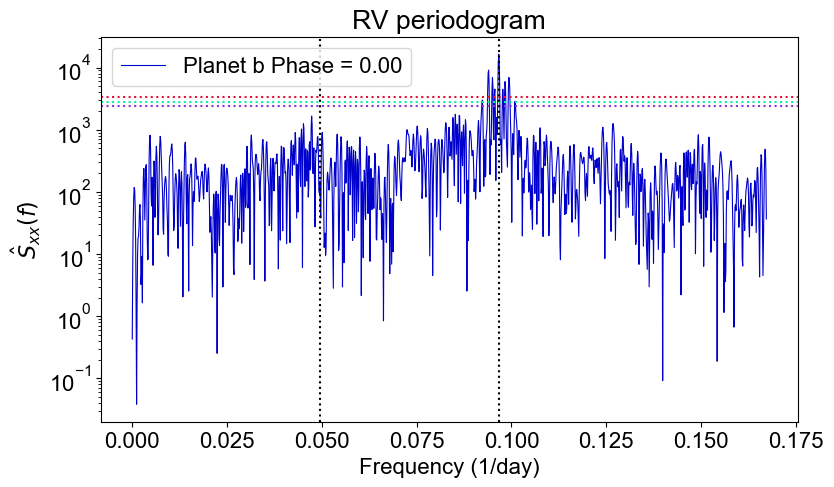

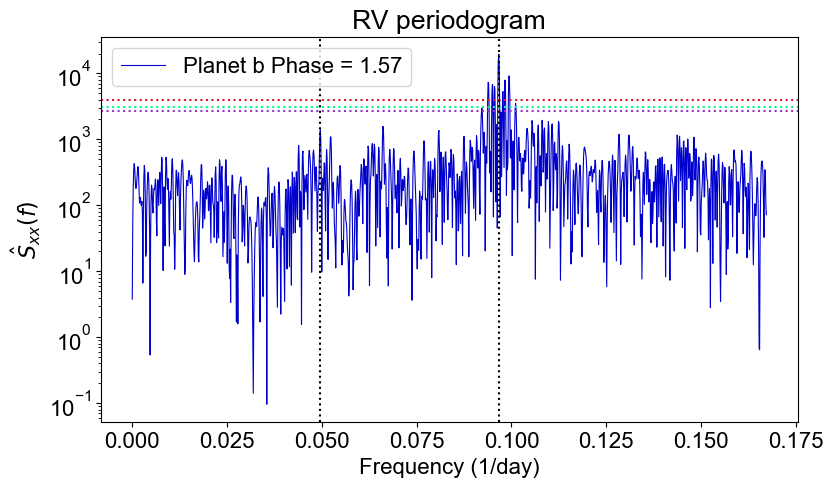

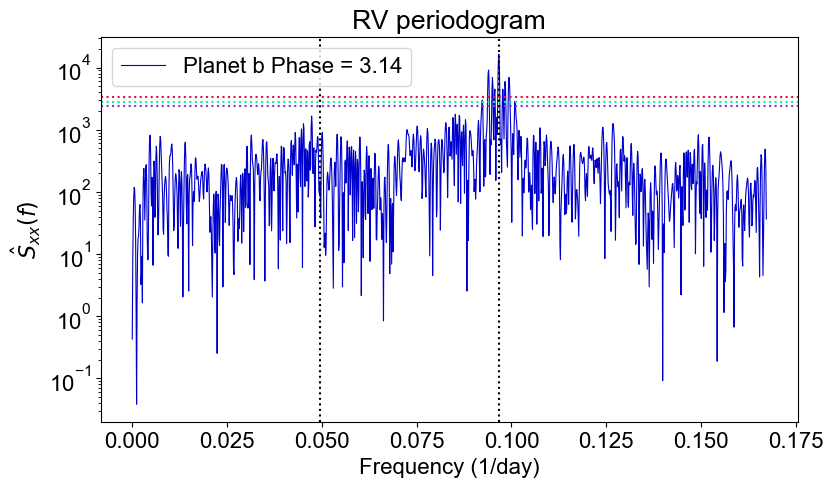

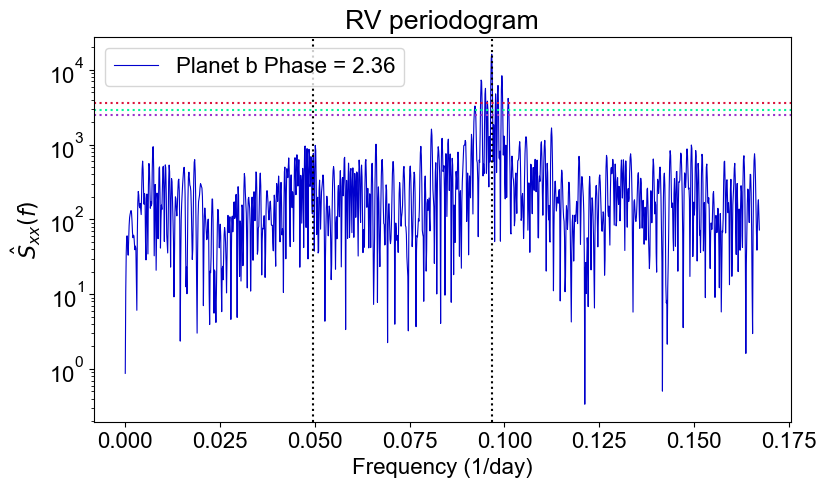

In [124]:
for m in range(4):
    RV1FT[m].powplot(title='RV periodogram', vlines=planets)
    plt.xlabel('Frequency (1/day)')
    plt.ylabel('$\hat{S}_{xx}(f)$')
    plt.legend(['Planet b' f' Phase = {phase[m]:.2f}'])

Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
F

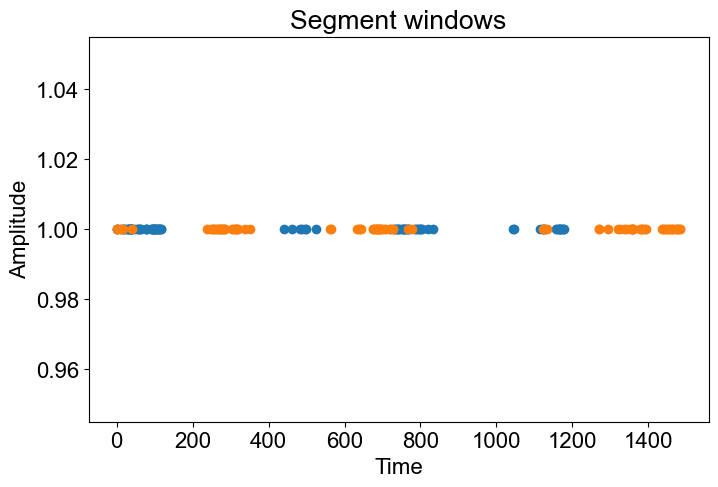

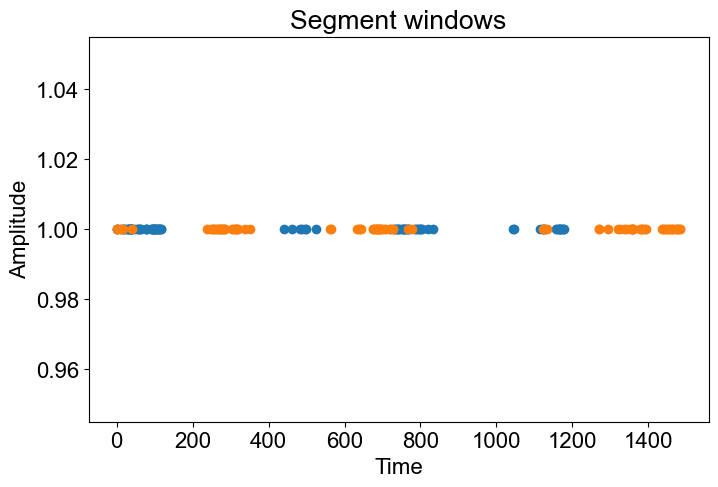

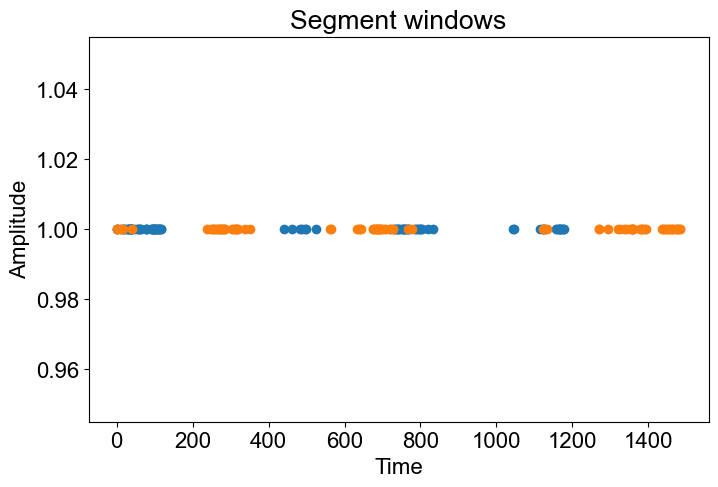

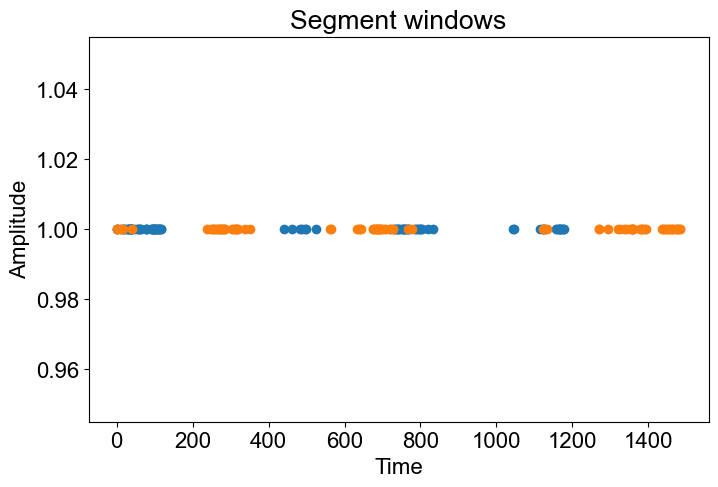

In [125]:
nyquistm = 0.03504
for u in range(4):
    RV1FT[u].segment_data(2, 5*nyquistm, window = 'None', plot_windows = True)
    RV1FT[u].Welch_powspec()
    RV1FT[u].Welch_powspec_bootstrap()

<>:2: SyntaxWarning: invalid escape sequence '\h'
<>:2: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/1535574278.py:2: SyntaxWarning: invalid escape sequence '\h'
  RV1FT[w].powplot(title= '$\hat{S}_{xx}(f)$', Welch = True, vlines=planets)


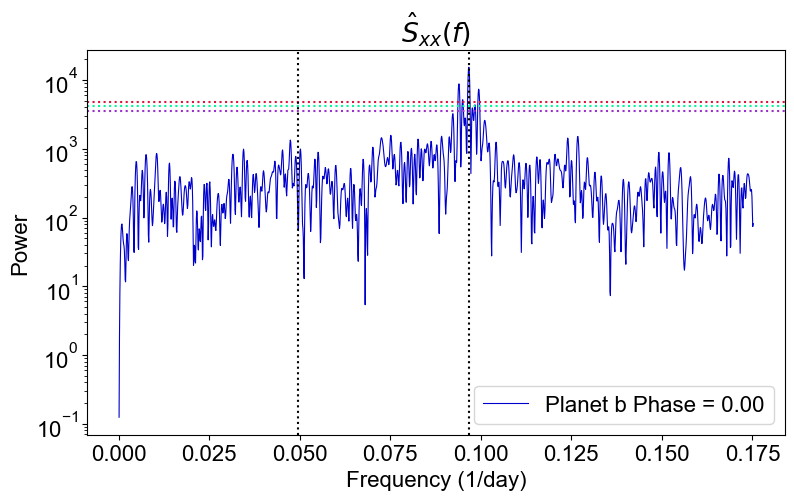

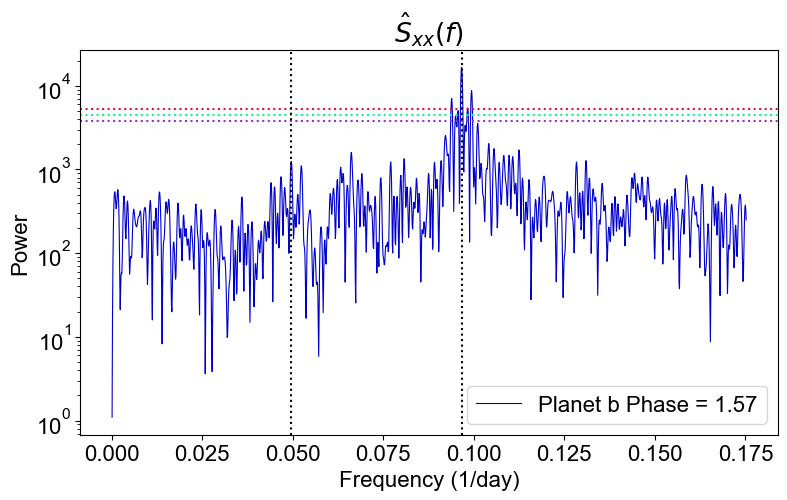

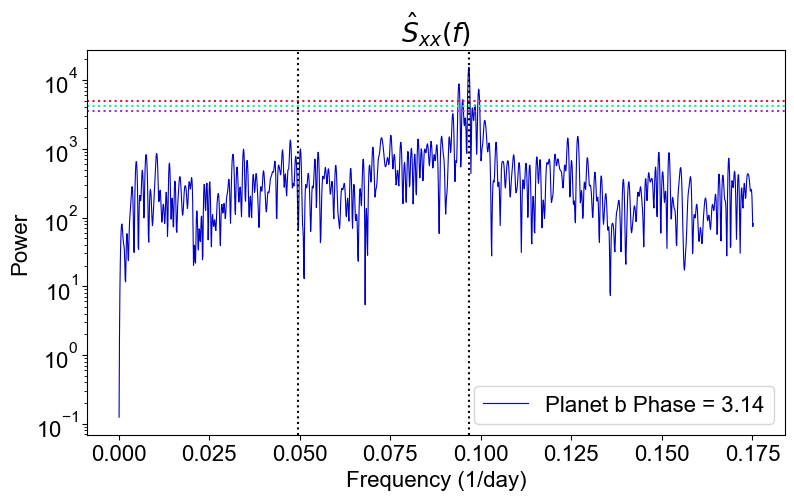

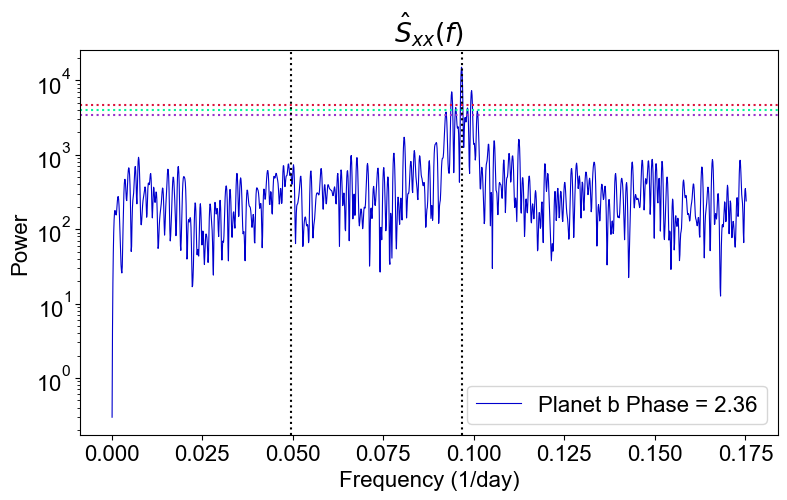

In [126]:
for w in range(4):
    RV1FT[w].powplot(title= '$\hat{S}_{xx}(f)$', Welch = True, vlines=planets)
    plt.legend(['Planet b' f' Phase = {phase[w]:.2f}'])
    plt.xlabel('Frequency (1/day)')
    

In [127]:
fb=1/pb
fc=1/pc
df=fb-fc

Half bandwidth: 0.003032
Welch average spectral window not saved to file
Half bandwidth: 0.003032
Welch average spectral window not saved to file
Half bandwidth: 0.003032
Welch average spectral window not saved to file
Half bandwidth: 0.003032
Welch average spectral window not saved to file


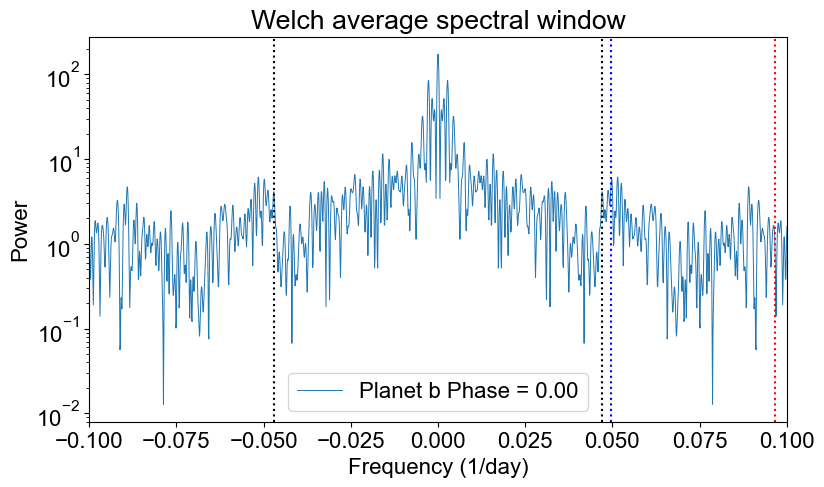

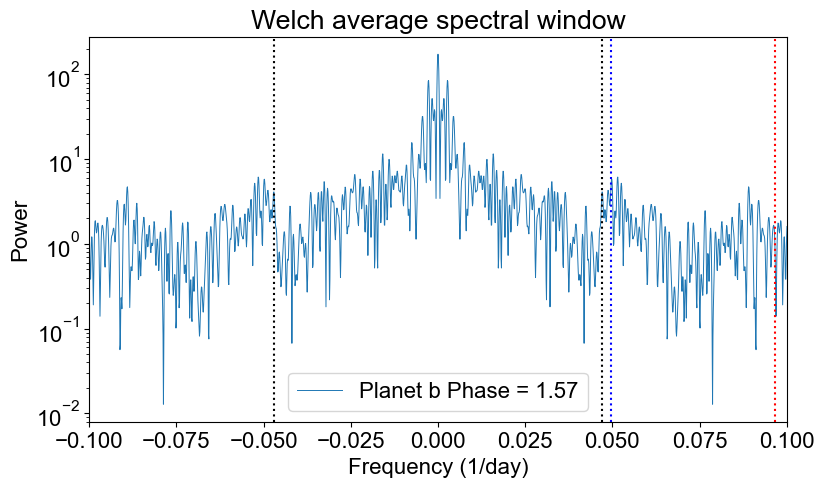

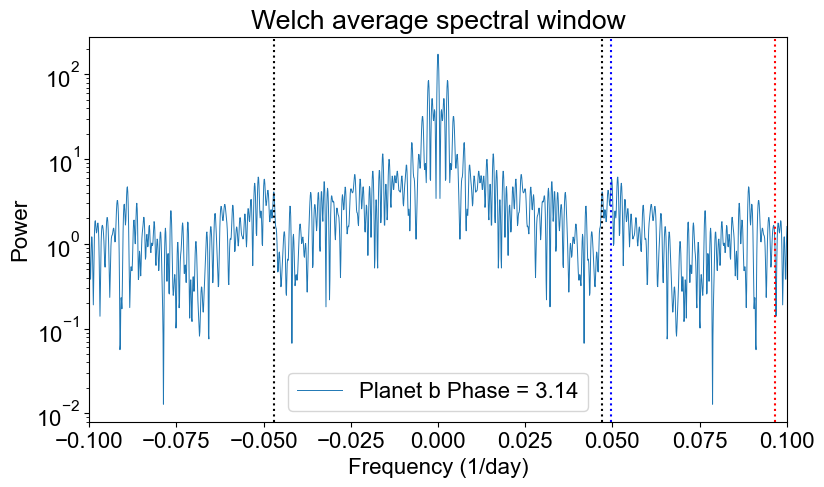

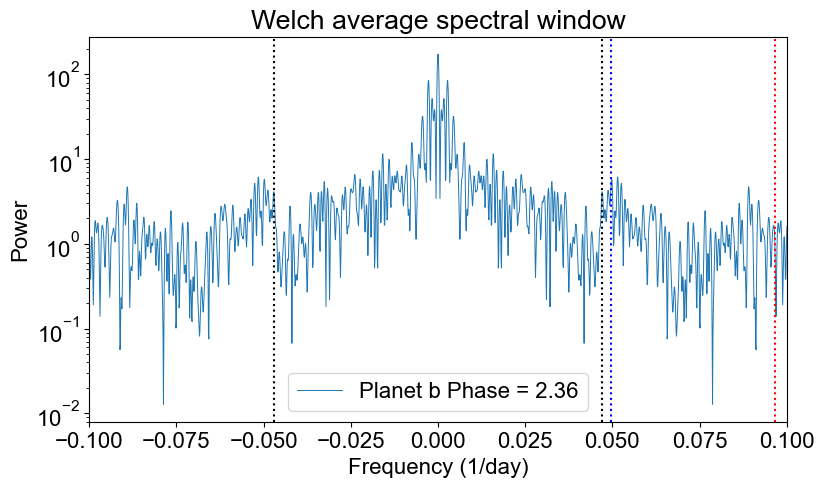

In [128]:
for r in range(4):
    RV1FT[r].spectral_window_Welch()
    plt.xlim([-0.1, 0.1])
    plt.axvline(df, ls=':', color='k')
    plt.axvline(-df, ls=':', color='k')
    plt.axvline(fb, ls=':', color='r')
    plt.axvline(fc, ls=':', color='b')
    plt.legend(['Planet b' f' Phase = {phase[r]:.2f}'])
    plt.xlabel('Frequency (1/day)')

Planet c

In [129]:
RV2F=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]

for j in range(len(phase)):
    RV2F[j,:]=np.sin(2 * np.pi * 1/pc * t + phase[j])

In [130]:
RV2FT =[]

for k in range(4):
    RV2FT.append(TimeSeries.TimeSeries(t,RV2F[k,:]))

Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051
Nyquist frequency from mean dt: 0.03504
Nyquist frequency from 10% trimmed mean dt: 0.09190
Nyquist frequency from 20% trimmed mean dt: 0.11892
Nyquist frequency from median dt: 0.16714
Rayleigh resolution: 0.00051


In [131]:
for n in range(4):
    RV2FT[n].frequency_grid(0.16714 ) 
    RV2FT[n].pow_FT()

Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3

<>:4: SyntaxWarning: invalid escape sequence '\h'
<>:4: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3437402388.py:4: SyntaxWarning: invalid escape sequence '\h'
  plt.ylabel('$\hat{S}_{xx}(f)$')


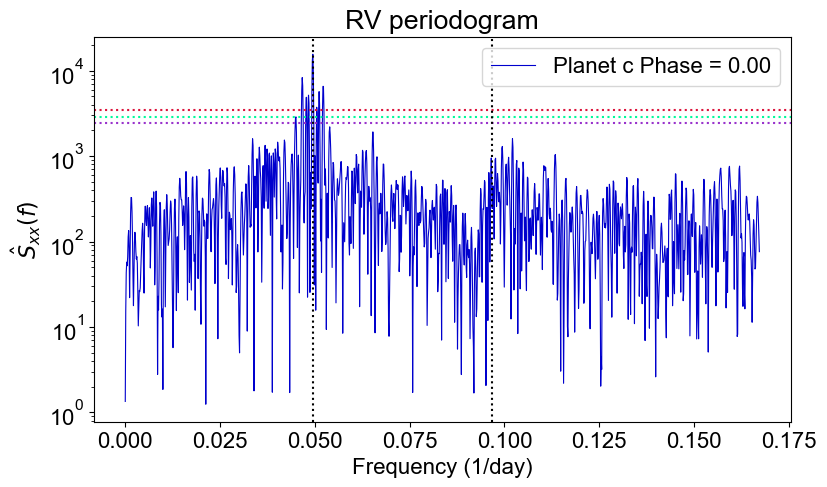

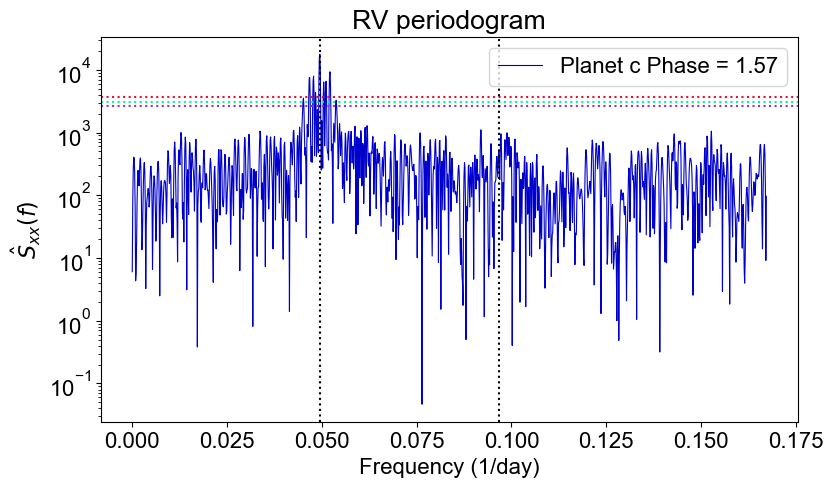

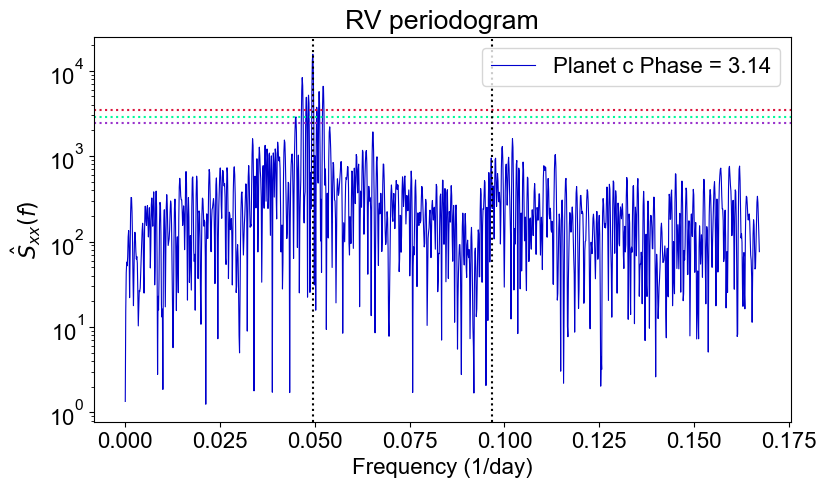

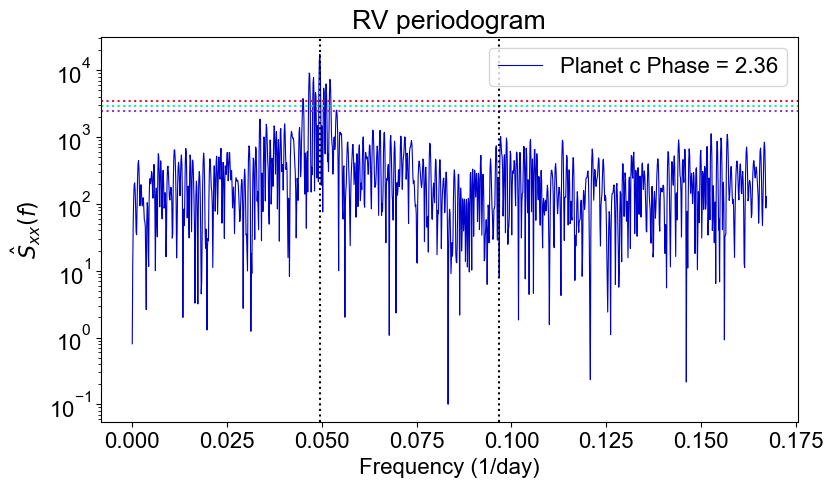

In [132]:
for m in range(4):
    RV2FT[m].powplot(title='RV periodogram', vlines=planets)
    plt.xlabel('Frequency (1/day)')
    plt.ylabel('$\hat{S}_{xx}(f)$')
    plt.legend(['Planet c' f' Phase = {phase[m]:.2f}'])
    

Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Iteration 0
Iteration 500
Iteration 1000
Iteration 1500
Iteration 2000
Iteration 2500
Iteration 3000
Iteration 3500
Iteration 4000
Iteration 4500
Iteration 5000
Iteration 5500
Iteration 6000
Iteration 6500
Iteration 7000
Iteration 7500
Iteration 8000
Iteration 8500
Iteration 9000
Iteration 9500
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
F

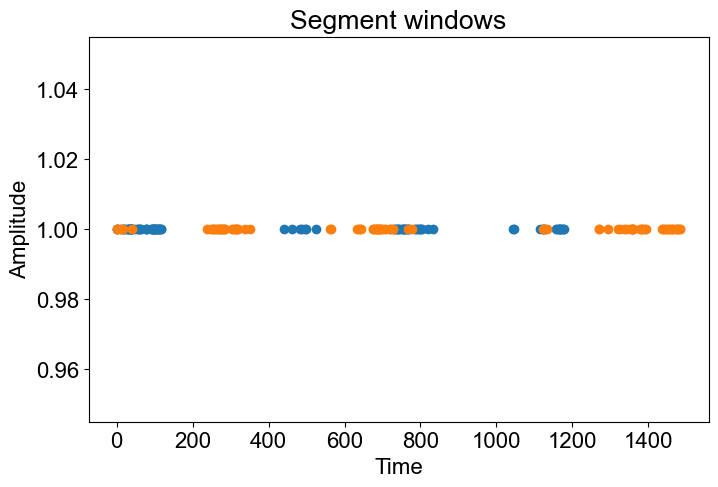

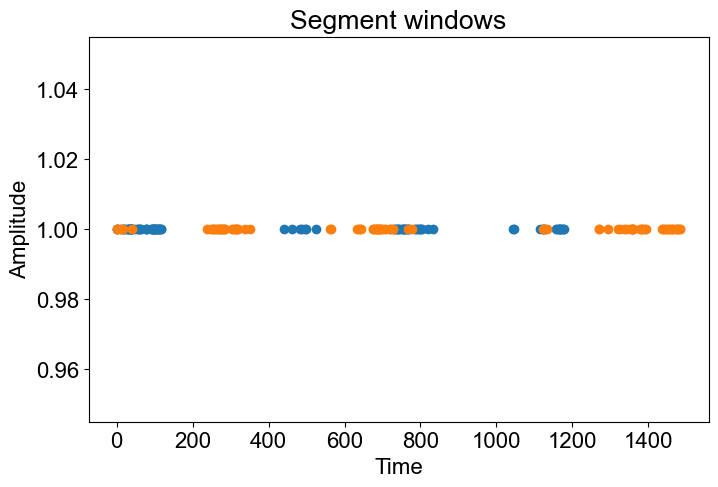

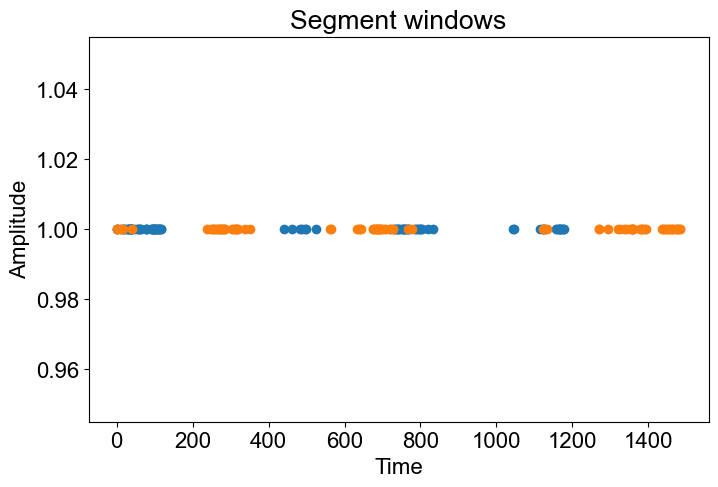

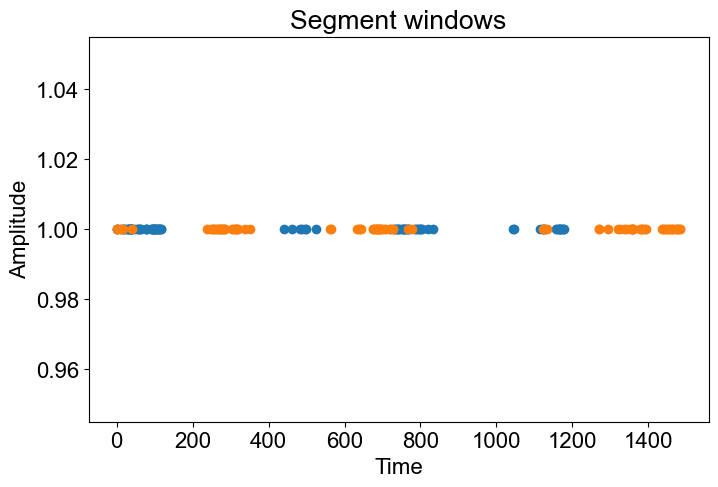

In [133]:
nyquistm = 0.03504
for u in range(4):
    RV2FT[u].segment_data(2, 5*nyquistm, window = 'None', plot_windows = True)
    RV2FT[u].Welch_powspec()
    RV2FT[u].Welch_powspec_bootstrap()

<>:2: SyntaxWarning: invalid escape sequence '\h'
<>:2: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3801392704.py:2: SyntaxWarning: invalid escape sequence '\h'
  RV2FT[w].powplot(title= '$\hat{S}_{xx}(f)$', Welch = True, vlines=planets)


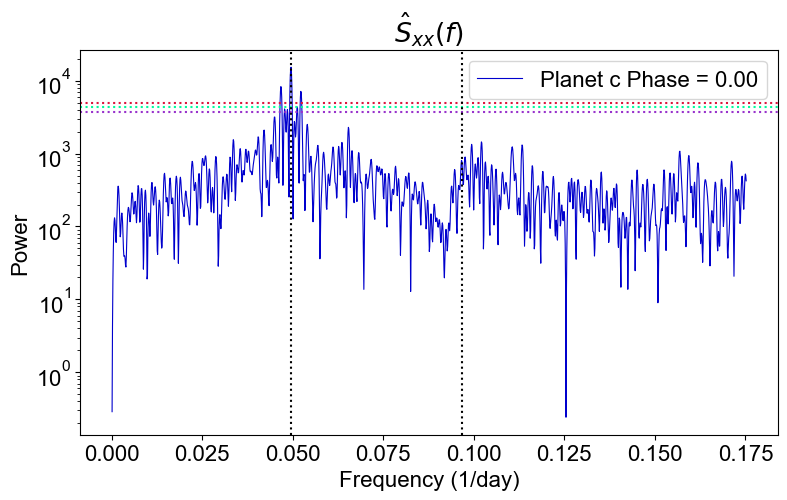

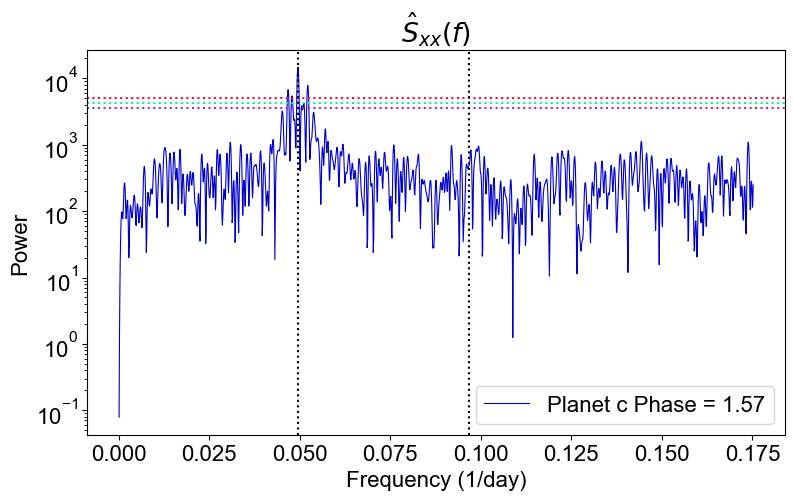

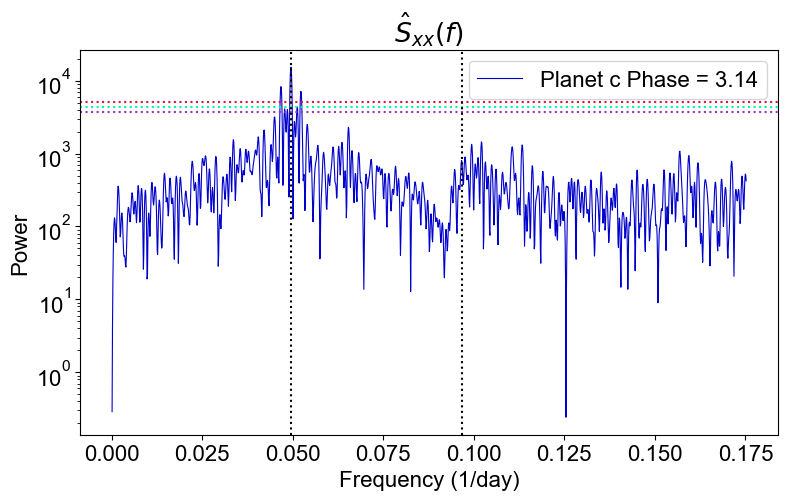

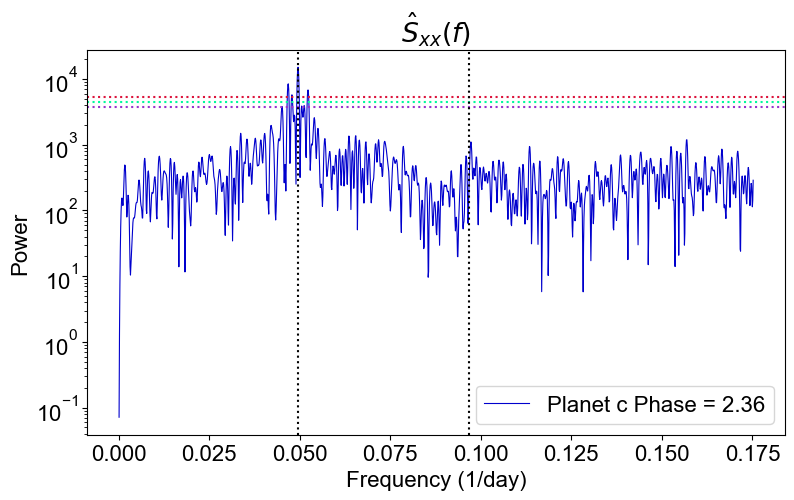

In [134]:
for w in range(4):
    RV2FT[w].powplot(title= '$\hat{S}_{xx}(f)$', Welch = True, vlines=planets)
    plt.legend(['Planet c' f' Phase = {phase[w]:.2f}'])
    plt.xlabel('Frequency (1/day)')

Half bandwidth: 0.003032
Welch average spectral window not saved to file
Half bandwidth: 0.003032
Welch average spectral window not saved to file
Half bandwidth: 0.003032
Welch average spectral window not saved to file
Half bandwidth: 0.003032
Welch average spectral window not saved to file


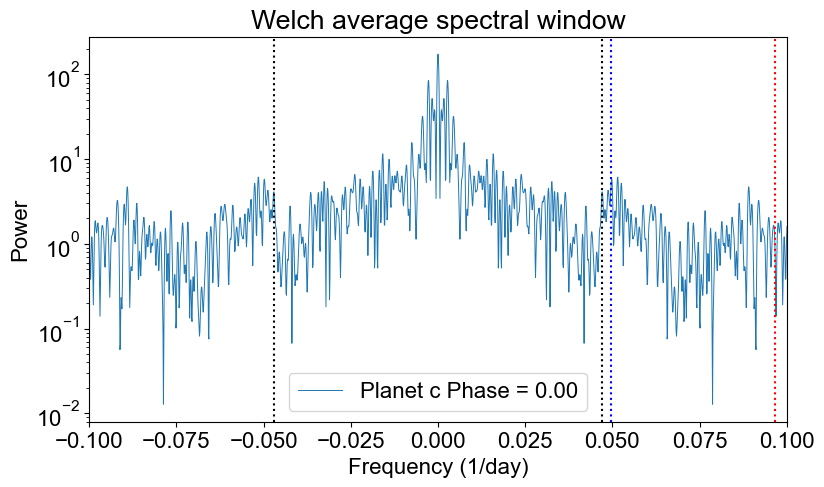

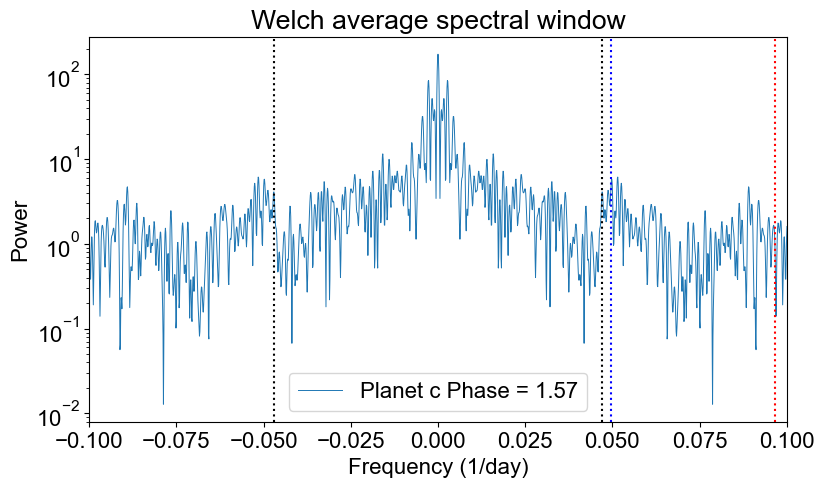

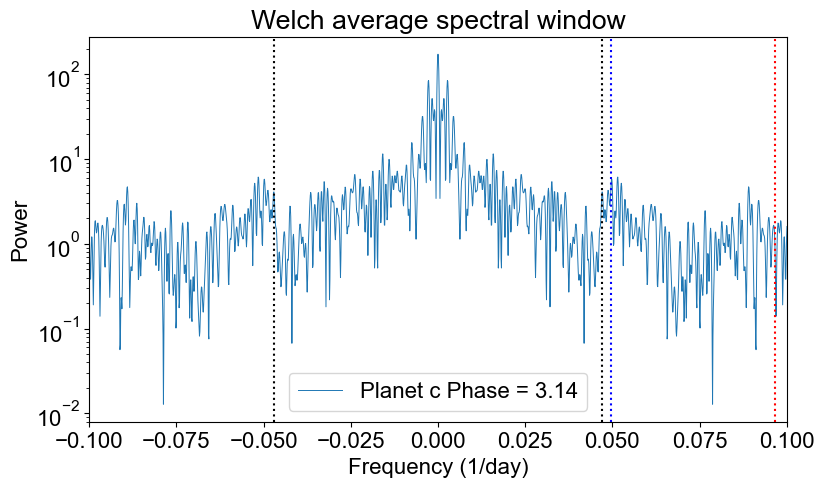

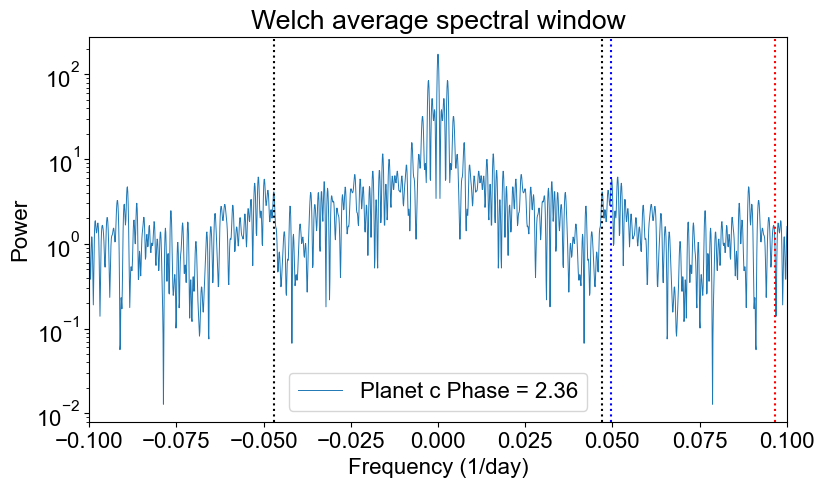

In [135]:
for r in range(4):
    RV2FT[r].spectral_window_Welch()
    plt.xlim([-0.1, 0.1])
    plt.axvline(df, ls=':', color='k')
    plt.axvline(-df, ls=':', color='k')
    plt.axvline(fb, ls=':', color='r')
    plt.axvline(fc, ls=':', color='b')
    plt.legend(['Planet c' f' Phase = {phase[r]:.2f}'])
    plt.xlabel('Frequency (1/day)')

Use the python random number generator https://numpy.org/doc/stable/reference/random/generated/numpy.random.randn.html

Different noise amplitudes: 0.3 m/s, 0.5 m/s, 0.75 m/s, 1 m/s, 2 m/s, 3 m/s

For each phase and each noise amplitude, do 100 trials (calculate 100 pseudowindows)

In [136]:
amplitudes = [0.3, 0.5, 0.75, 1, 2, 3]
N = np.random.randn(len(t))

In [137]:
RV1F_noise03=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    RV1F_noise03[j,:]=np.sin(2 * np.pi * 1/pb * t + phase[j])+(0.3*N)


RV1F_noise05=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    RV1F_noise05[j,:]=np.sin(2 * np.pi * 1/pb * t + phase[j])+(0.5*N)



RV1F_noise075=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    RV1F_noise075[j,:]=np.sin(2 * np.pi * 1/pb * t + phase[j])+(0.75*N)

RV1F_noise1=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    RV1F_noise1[j,:]=np.sin(2 * np.pi * 1/pb * t + phase[j])+(1*N)


RV1F_noise2=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    RV1F_noise2[j,:]=np.sin(2 * np.pi * 1/pb * t + phase[j])+(2*N)

RV1F_noise3=np.zeros((4,len(t)))

phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    RV1F_noise3[j,:]=(np.sin(2 * np.pi * 1/pb * t + phase[j])+(3*N))

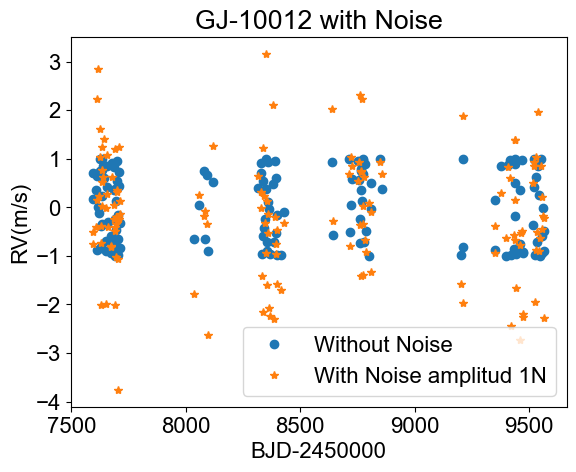

In [138]:
plt.plot(t, RV1F[1,:], 'o', label='Without Noise')
plt.plot(t,RV1F_noise1[1,:],'*', label='With Noise amplitud 1N')
plt.ylabel('RV(m/s)')
plt.xlabel('BJD-2450000')
plt.title('GJ-10012 with Noise')  
plt.legend()  
plt.show()

Planet b

In [139]:
t_0 = t[0]
t_n_1 = t[-1]

R = 1 / (t_n_1 - t_0)

print(f"Rayleigh resolution is: {R}")

Rayleigh resolution is: 0.0005078851712258673


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673


<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/4117675773.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

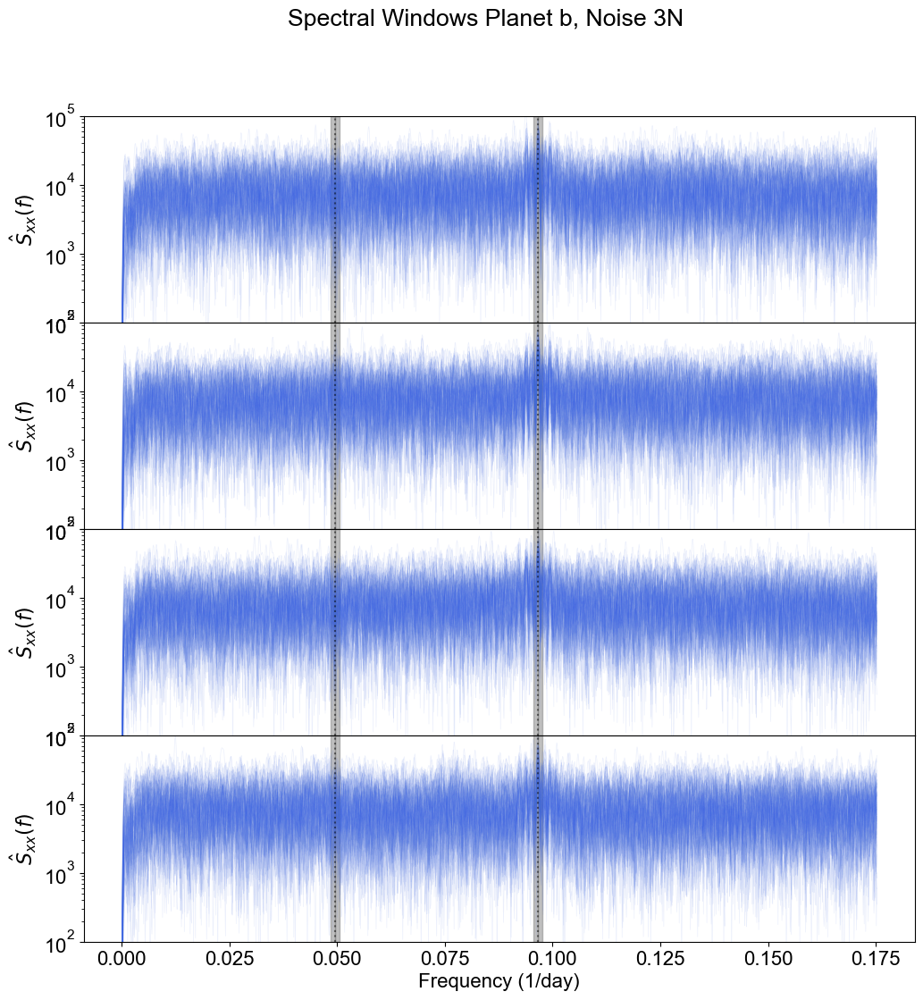

In [140]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet b, Noise 3N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pb * t + phase[j])+(3*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/2285102249.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

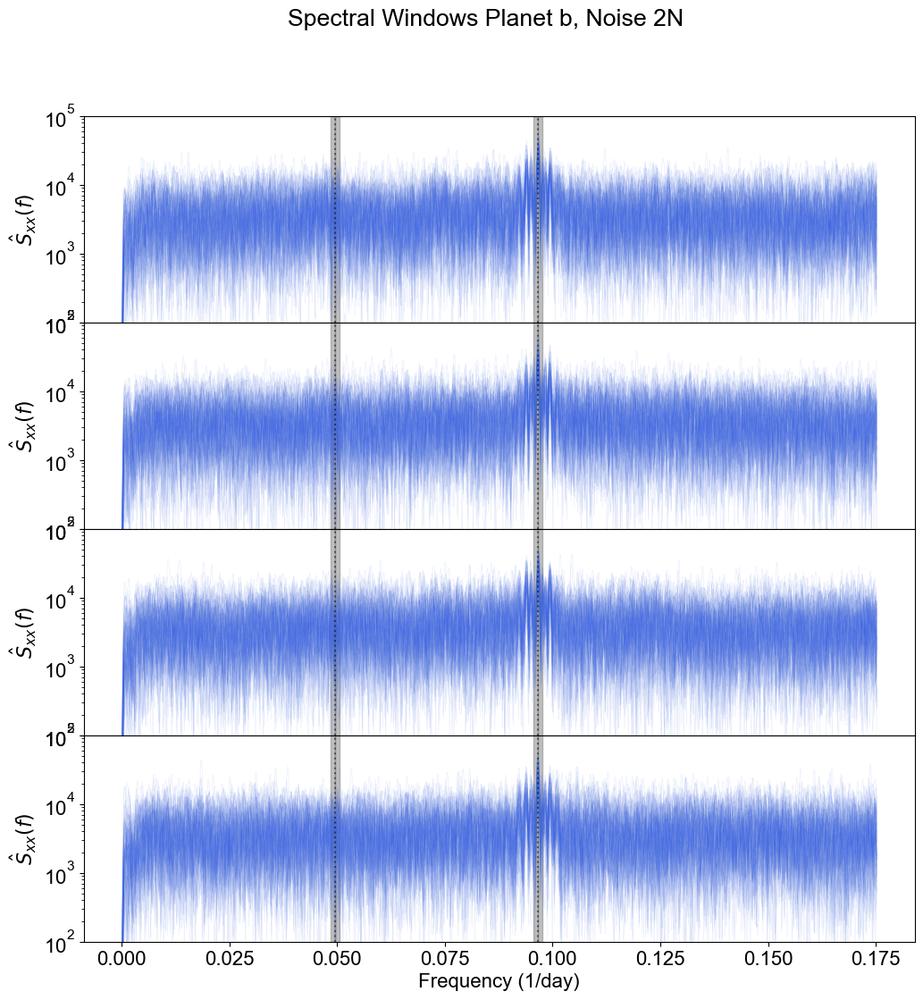

In [141]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet b, Noise 2N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pb * t + phase[j])+(2*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/320290734.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

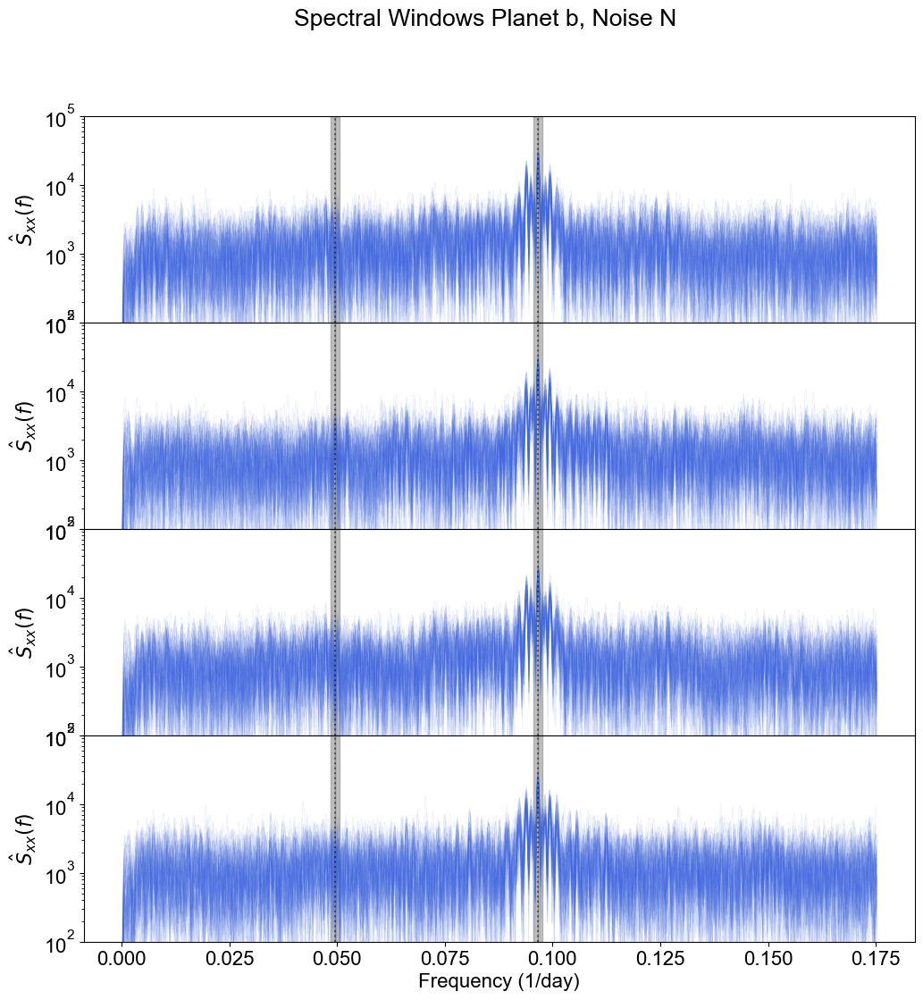

In [142]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet b, Noise N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pb * t + phase[j])+(N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/524831425.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

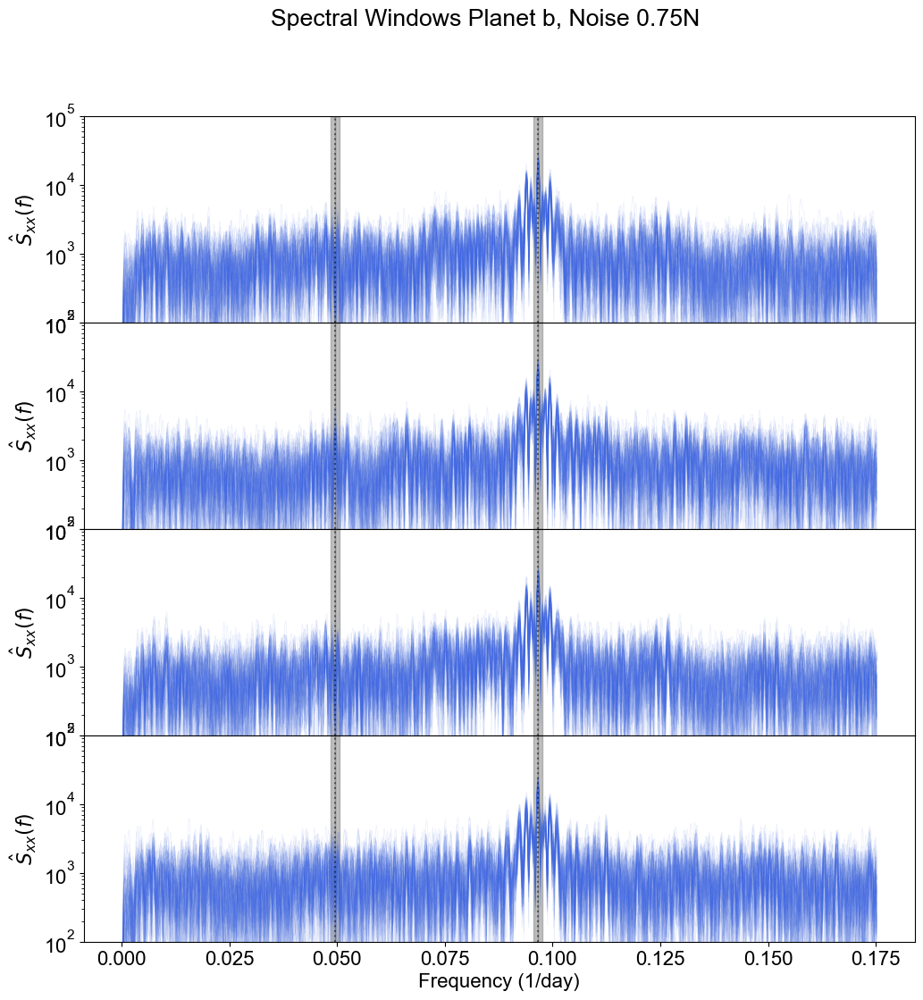

In [143]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet b, Noise 0.75N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pb * t + phase[j])+(0.75*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/1745148237.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

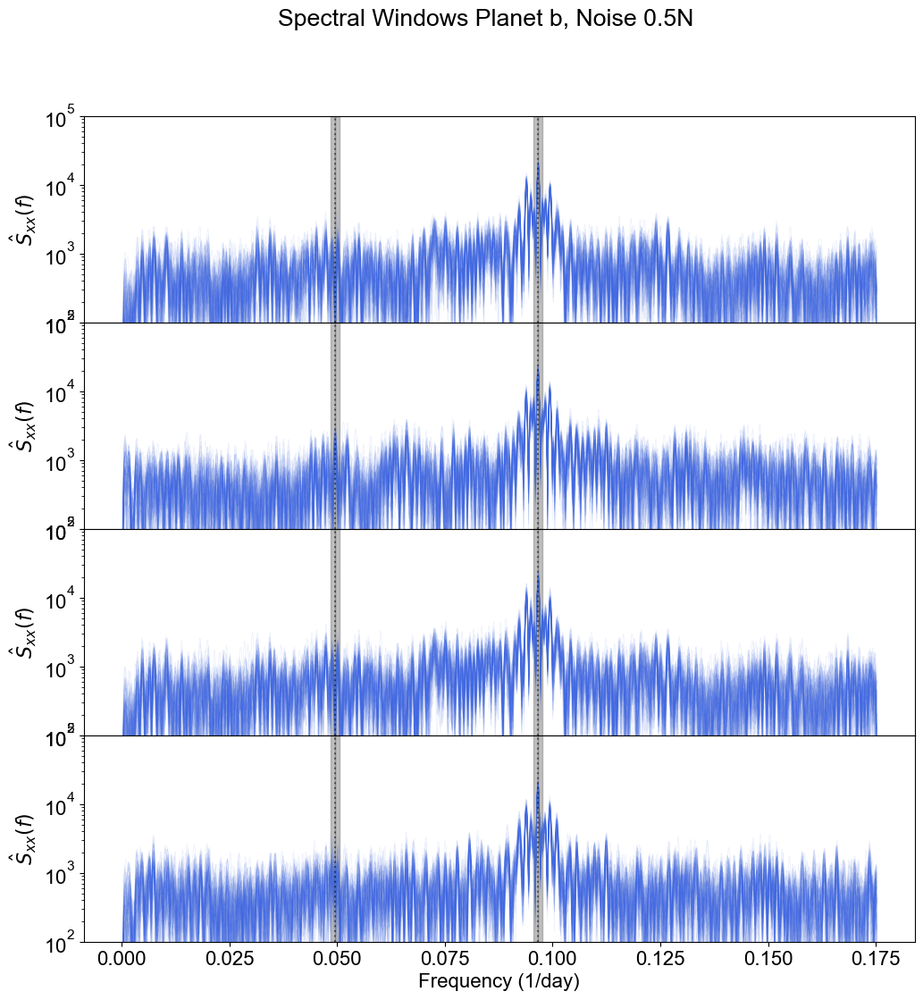

In [144]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet b, Noise 0.5N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pb * t + phase[j])+(0.5*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3190097961.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

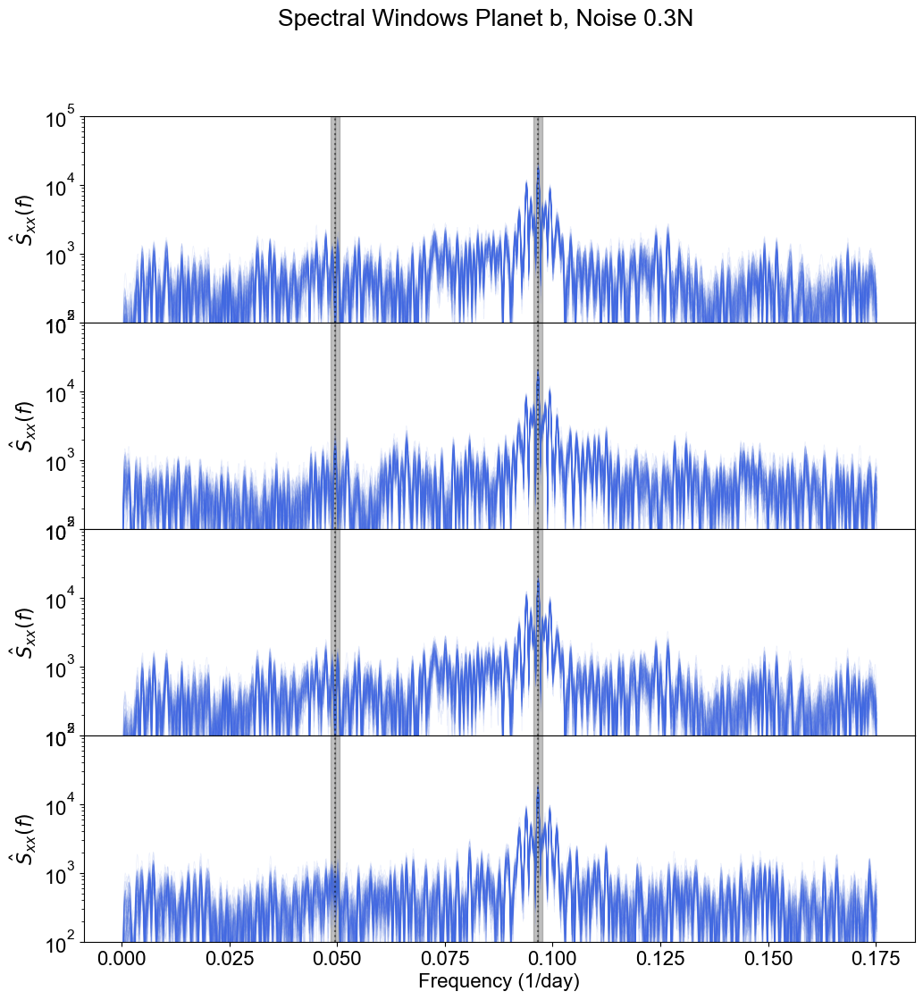

In [145]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet b, Noise 0.3N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pb * t + phase[j])+(0.3*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

Planet c

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/1956008069.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

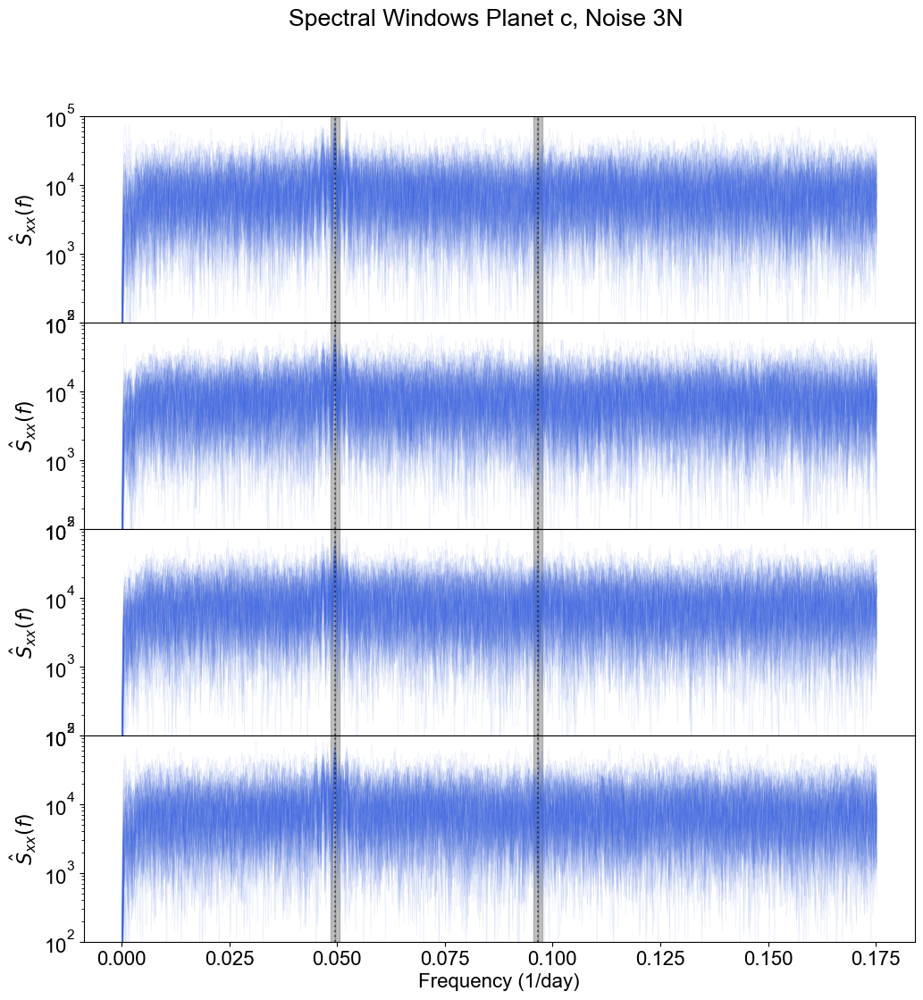

In [146]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet c, Noise 3N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pc * t + phase[j])+(3*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/1678242524.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

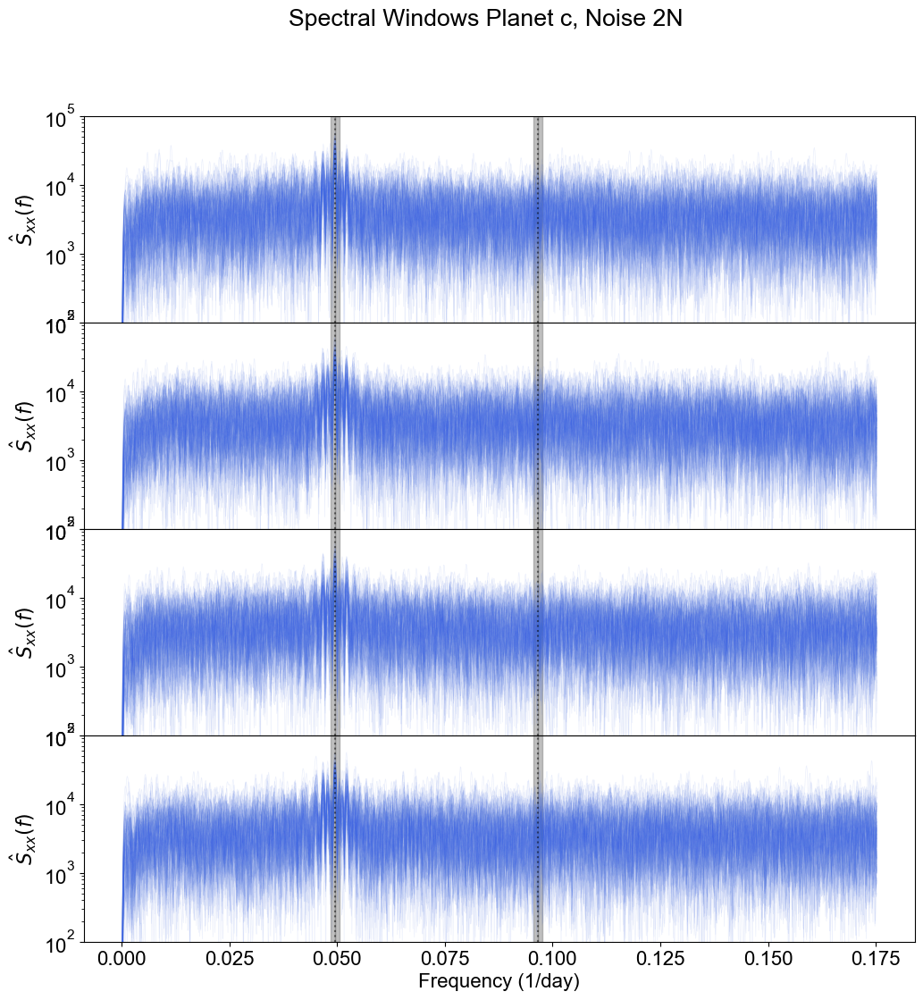

In [147]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet c, Noise 2N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pc * t + phase[j])+(2*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3080361267.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

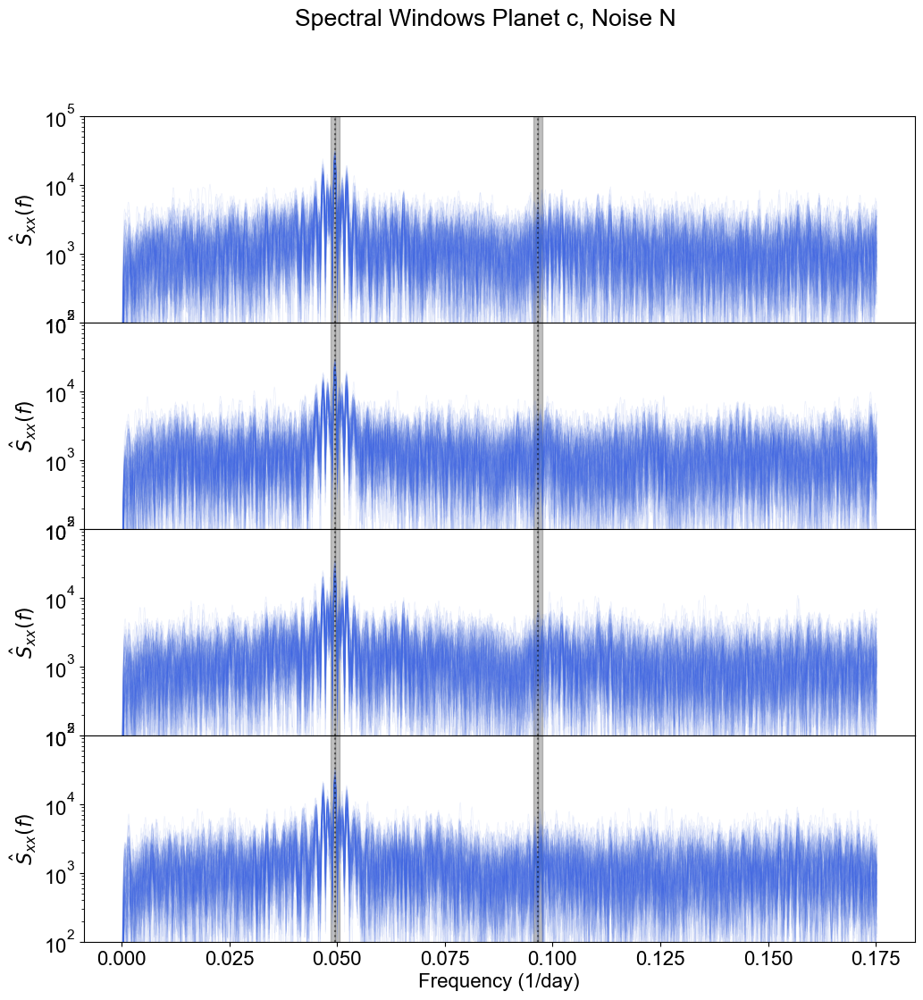

In [148]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet c, Noise N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pc * t + phase[j])+(N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3587358600.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

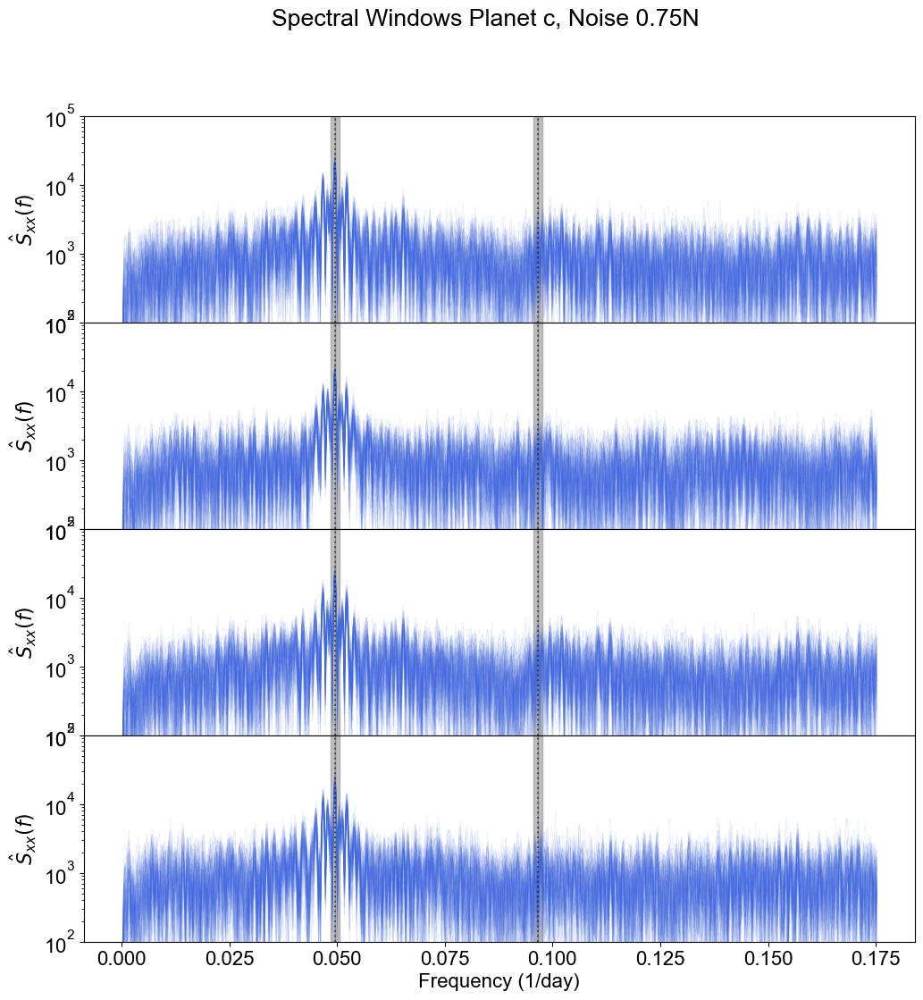

In [149]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet c, Noise 0.75N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pc * t + phase[j])+(0.75*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/3396974006.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

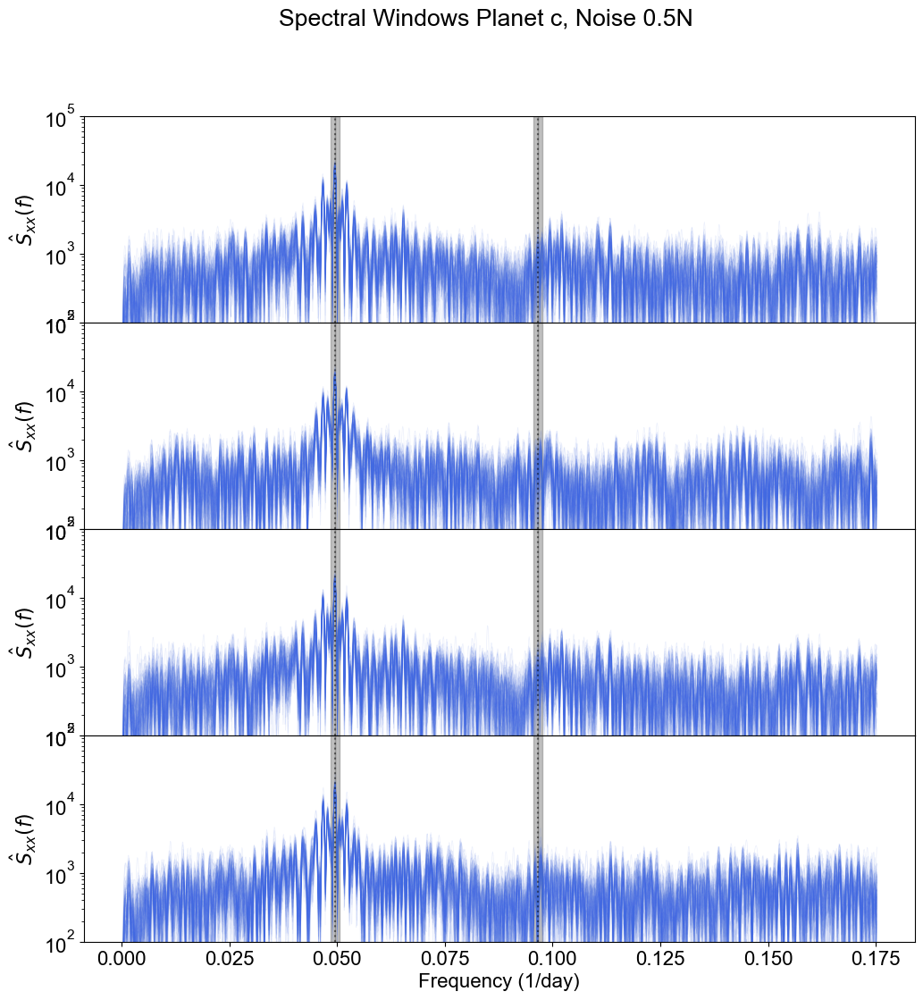

In [150]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet c, Noise 0.5N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pc * t + phase[j])+(0.5*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 

<>:53: SyntaxWarning: invalid escape sequence '\h'
<>:53: SyntaxWarning: invalid escape sequence '\h'
/var/folders/n2/qpbrzh194y571g9lfznmxsb00000gq/T/ipykernel_75151/2079385280.py:53: SyntaxWarning: invalid escape sequence '\h'
  ax[j].set_ylabel('$\hat{S}_{xx}(f)$')


Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timestep. Make sure that makes
sense for your dataset.
Number of segments: 2
Segment start and end points: [[  0  92]
 [ 46 139]]
Effective number of segments: 1.600000
Frequency grid spacing: 0.000112
Minimum 6-dB main lobe half width: 0.000815
Mean 6-dB main lobe half width (1/2 resolution limit): 0.000920
Best achievable Rayleigh limit (1/2 best-case resolution limit): 0.000673
Number of data points per segment: 92
frequency associated with the median timeste

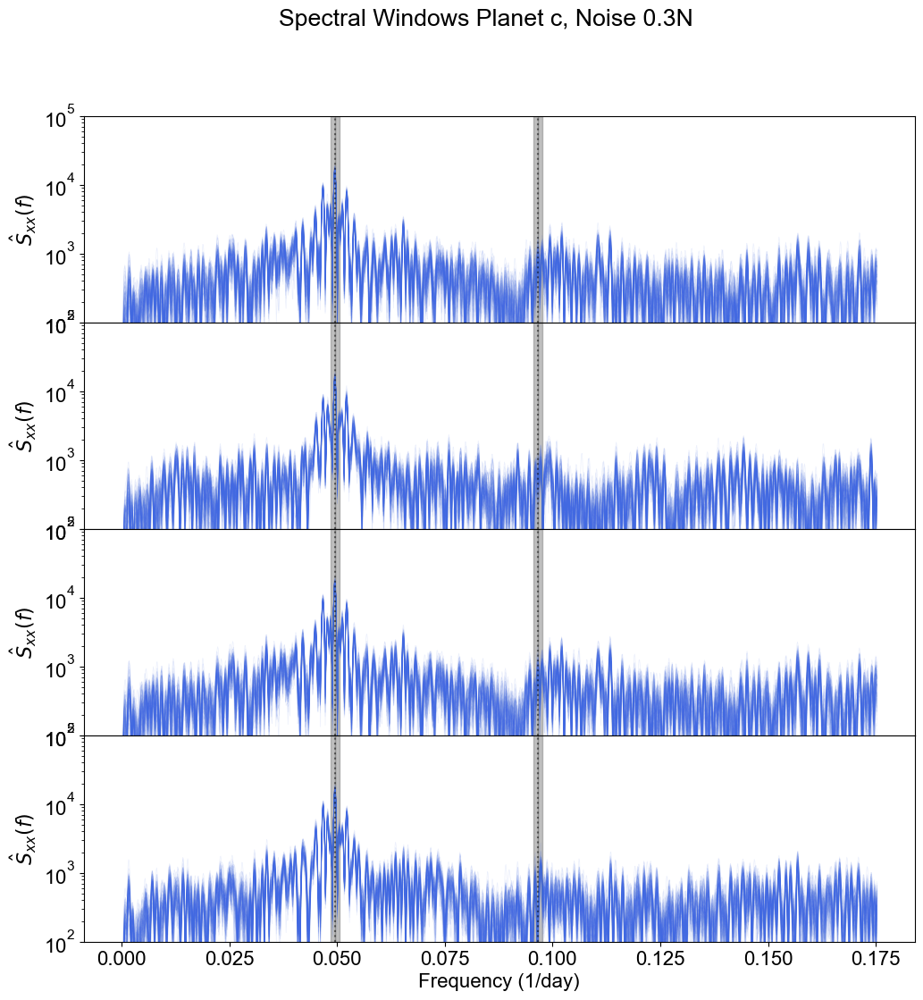

In [151]:
#plt.figure(figsize=(10,10))
fig, ax = plt.subplots(nrows = 4, ncols=1, figsize=(12,12), sharex = True, \
                               gridspec_kw = {'wspace':0, 'hspace':0})
fig.suptitle('Spectral Windows Planet c, Noise 0.3N') 
phase=[0,np.pi/2,np.pi,3*np.pi/4]
for j in range(len(phase)):
    for i in range(100):
        N = np.random.randn(len(t))
        temp=np.sin(2 * np.pi * 1/pc * t + phase[j])+(0.3*N)
        temp2=TimeSeries.TimeSeries(t,temp, display_frequency_info=False)
        temp2.segment_data(2, 5*nyquistm, window = 'None', plot_windows = False)
        temp2.Welch_powspec()
        #temp2.spectral_window_Welch(plot=False)
        ax[j].semilogy(temp2.Welch_powgrid,temp2.Welch_pow, alpha=0.1, color='royalblue',lw=0.5)
        #plt.xlim(0,0.05)
        ax[j].set_ylim(1e2,1e5)


    ax[j].axvline(fb, ls=':', color='k',alpha=0.5)
    ax[j].axvline(fc, ls=':', color='k',alpha=0.5)
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb + 2 * R, 

        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc + 2 * R, 
        color='gray',  
        alpha=0.5   
        )

    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fc,  
        fc - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].fill_betweenx(
        [1e2, 1e5],  
        fb,  
        fb - 2 * R,  
    
        color='gray',  
        alpha=0.5  
    )
    ax[j].set_ylabel('$\hat{S}_{xx}(f)$')  

    ax[-1].set_xlabel('Frequency (1/day)' ) 